In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Model, load_model
from tensorflow.keras import backend as K
from tensorflow.keras.applications import ResNet50
from skimage.metrics import structural_similarity as ssim
from skimage import color
import numpy as np
from PIL import Image
import os
import random
from tqdm import tqdm
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Set global precision policy to float32
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('float32')

# Check for GPU availability
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"GPUs available: {len(gpus)}")
    for gpu in gpus:
        print(f"Device: {gpu.name}")
else:
    print("No GPU available. Using CPU.")

# Define the dataset directory
dataset_dir = 'REVIDE_inside'

# Define directories based on the dataset structure
train_gt_dir = os.path.join(dataset_dir, 'Train', 'gt')
train_hazy_dir = os.path.join(dataset_dir, 'Train', 'hazy')
test_gt_dir = os.path.join(dataset_dir, 'Test', 'gt')
test_hazy_dir = os.path.join(dataset_dir, 'Test', 'hazy')

def load_image_paths(directory):
    """Load image file paths from a directory."""
    image_paths = []
    for subdir, _, files in os.walk(directory):
        for file in files:
            img_path = os.path.join(subdir, file)
            image_paths.append(img_path)
    return image_paths

def preprocess_image(img_path, target_size=(512, 512)):
    """Preprocess an image: read, resize, and normalize using Pillow."""
    img_path = img_path.numpy().decode('utf-8')  # Convert EagerTensor to a string
    img = Image.open(img_path)  # Read image using Pillow
    img = img.resize(target_size)  # Resize image to target size
    img = np.array(img) / 255.0  # Convert to NumPy array and normalize to [0, 1]
    return img

def preprocess_image_with_label(img_path, label_path, target_size=(512, 512)):
    """Preprocess both image and its label."""
    img = preprocess_image(img_path, target_size)
    label = preprocess_image(label_path, target_size)
    return img, label

def create_dataset(image_paths, label_paths, batch_size=1, target_size=(512, 512)):
    """Create a TensorFlow dataset."""
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, label_paths))
    
    def load_and_preprocess(image_path, label_path):
        img, label = tf.py_function(
            preprocess_image_with_label, 
            [image_path, label_path], 
            [tf.float32, tf.float32]
        )
        img.set_shape(target_size + (3,))  # Ensure shapes are correctly set
        label.set_shape(target_size + (3,))
        return img, label

    dataset = dataset.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    return dataset

# Load image paths
print("Loading Training Data Paths...")
train_gt_paths = load_image_paths(train_gt_dir)
train_hazy_paths = load_image_paths(train_hazy_dir)

print("Loading Testing Data Paths...")
test_gt_paths = load_image_paths(test_gt_dir)
test_hazy_paths = load_image_paths(test_hazy_dir)

# Convert lists to numpy arrays
train_gt_paths = np.array(train_gt_paths)
train_hazy_paths = np.array(train_hazy_paths)
test_gt_paths = np.array(test_gt_paths)
test_hazy_paths = np.array(test_hazy_paths)

# Create TensorFlow datasets with updated resolution
batch_size = 1  # Adjust batch size for memory constraints with 512x512 images
train_dataset = create_dataset(train_hazy_paths, train_gt_paths, batch_size, target_size=(512, 512))
test_dataset = create_dataset(test_hazy_paths, test_gt_paths, batch_size, target_size=(512, 512))

def residual_dense_block(x, filters, growth_rate=32, num_layers=4):
    inputs = x
    dense_layers = []

    for i in range(num_layers):
        out = layers.Conv2D(growth_rate, (3, 3), padding='same', activation='relu')(x)
        dense_layers.append(out)
        if len(dense_layers) > 1:
            x = layers.Concatenate()(dense_layers)
        else:
            x = dense_layers[0]

    x = layers.Conv2D(filters, (1, 1), padding='same')(x)
    
    if inputs.shape[-1] != filters:
        inputs = layers.Conv2D(filters, (1, 1), padding='same')(inputs)
        
    x = layers.Add()([x, inputs])
    return x

def up_block(x, skip, filters):
    # Upsample by a factor of 2
    x = layers.UpSampling2D((2, 2))(x)
    
    # Apply a convolution to match the channel dimension of the skip connection
    x = layers.Conv2D(filters, (3, 3), padding='same', activation='relu')(x)
    
    # Resize the skip connection tensor to match the upsampled tensor if necessary
    skip = layers.Conv2D(filters, (3, 3), padding='same', activation='relu')(skip)
    
    # Make sure both tensors have the same height and width
    x = tf.image.resize(x, (tf.shape(skip)[1], tf.shape(skip)[2]))

    # Concatenate the upsampled tensor with the skip connection
    x = layers.Concatenate()([x, skip])
    
    # Apply a residual dense block after concatenation
    x = residual_dense_block(x, filters)
    return x

def intensity_attention_block(x, filters):
    """Intensity Attention Block to amplify input feature maps based on intensity and fuse them."""
    avg_pool = layers.GlobalAveragePooling2D()(x)
    dense = layers.Dense(filters, activation='relu')(avg_pool)
    dense = layers.Dense(filters, activation='sigmoid')(dense)
    attention = layers.Multiply()([x, dense[:, None, None, :]])
    
    atm_scattering_coeff = layers.Conv2D(filters, (1, 1), padding='same', activation='relu')(attention)
    atm_light_coeff = layers.Conv2D(filters, (1, 1), padding='same', activation='sigmoid')(atm_scattering_coeff)
    
    fused_output = layers.Add()([attention, atm_light_coeff])
    
    return fused_output

def sub_pixel_conv2d(scale):
    """Sub-pixel convolution layer."""
    return lambda x: tf.nn.depth_to_space(x, scale)

def sub_pixel_up_block(x, filters, scale):
    """Upsampling block using sub-pixel convolution."""
    x = layers.Conv2D(filters * (scale ** 2), (3, 3), padding='same', activation='relu')(x)
    x = layers.Lambda(sub_pixel_conv2d(scale))(x)
    return x

def build_hybrid_unet_rdn_with_attention(input_shape=(512, 512, 3)):
    inputs = layers.Input(shape=input_shape)

    def down_block(x, filters):
        x = residual_dense_block(x, filters)
        p = layers.MaxPooling2D((2, 2))(x)
        return x, p

    # Encoder
    skip1, pool1 = down_block(inputs, 64)
    skip2, pool2 = down_block(pool1, 128)

    # Bottleneck
    bottleneck = residual_dense_block(pool2, 256)

    # Decoder with Intensity Attention Block and Sub-Pixel Layers
    up1 = up_block(bottleneck, skip2, 128)
    up1 = intensity_attention_block(up1, 128)  # Apply IAB
    up1 = sub_pixel_up_block(up1, 128, scale=2)  # Apply sub-pixel upsampling

    up2 = up_block(up1, skip1, 64)
    up2 = intensity_attention_block(up2, 64)  # Apply IAB
    up2 = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(up2)  # Adjust channels as needed

    # Final output layer
    outputs = layers.Conv2D(3, (1, 1), activation='sigmoid', dtype='float32', padding='same')(up2)  # Ensure output is in float32

    # Ensure the output size matches the input size
    outputs = layers.Lambda(lambda x: tf.image.resize(x, (input_shape[0], input_shape[1])))(outputs)

    model = models.Model(inputs, outputs)
    return model

# Load a pre-trained ResNet50 model for perceptual loss
def get_resnet_model():
    """Load pre-trained ResNet50 model and extract feature maps for perceptual loss."""
    # Load pre-trained ResNet50 model without the top classification layer
    resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    
    # Select layers from different stages to extract features
    output_layers = [
        resnet.get_layer('conv1_relu').output,  # Early layer
        resnet.get_layer('conv2_block3_out').output,  # Mid-level layer
        resnet.get_layer('conv3_block4_out').output,  # Mid-level layer
        resnet.get_layer('conv4_block6_out').output,  # High-level layer
        resnet.get_layer('conv5_block3_out').output  # High-level layer
    ]
    
    # Create a model to extract features from these layers
    resnet_model = Model(inputs=resnet.input, outputs=output_layers)
    
    # Freeze the ResNet model parameters to prevent training
    resnet_model.trainable = False
    return resnet_model

# Initialize the ResNet model
resnet_model = get_resnet_model()

# Define SSIM and ResNet perceptual losses
def ssim_loss(y_true, y_pred):
    """Calculate SSIM loss."""
    return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

def resnet_perceptual_loss(y_true, y_pred):
    """Calculate ResNet perceptual loss."""
    # Resize input images to the ResNet's expected input size
    y_true_resized = tf.image.resize(y_true, (224, 224))
    y_pred_resized = tf.image.resize(y_pred, (224, 224))
    
    # Normalize input images as required by ResNet (similar to VGG preprocessing)
    y_true_resnet = tf.keras.applications.resnet.preprocess_input(y_true_resized * 255.0)
    y_pred_resnet = tf.keras.applications.resnet.preprocess_input(y_pred_resized * 255.0)
    
    # Extract features using ResNet
    true_features = resnet_model(y_true_resnet)
    pred_features = resnet_model(y_pred_resnet)
    
    # Calculate the perceptual loss as the MSE between feature maps
    loss = 0
    for true_feature, pred_feature in zip(true_features, pred_features):
        loss += K.mean(K.square(true_feature - pred_feature))
    
    return loss

def combined_resnet_loss(y_true, y_pred):
    """Combine MSE, SSIM, and ResNet perceptual loss."""
    mse_loss = K.mean(K.square(y_true - y_pred))
    ssim_loss_value = ssim_loss(y_true, y_pred)
    resnet_loss_value = resnet_perceptual_loss(y_true, y_pred)
    
    # Combine losses with different weights
    return 0.3 * mse_loss + 0.3 * ssim_loss_value + 0.4 * resnet_loss_value

# Build and compile the enhanced model
enhanced_model = build_hybrid_unet_rdn_with_attention()

# Compile the model with the new combined ResNet loss function
enhanced_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss=combined_resnet_loss)

# Display the enhanced model summary with the new loss
enhanced_model.summary()

GPUs available: 1
Device: /physical_device:GPU:0
Loading Training Data Paths...
Loading Testing Data Paths...
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 32  896         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 512, 512, 32  9248        ['conv2d[0][0]']

In [2]:
# Use early stopping and learning rate reduction on plateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

# Train the enhanced model
history = enhanced_model.fit(
    train_dataset,
    validation_data=test_dataset,
    epochs=100,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/100
1697/1697 [==============================] - 536s 305ms/step - loss: 1.4027 - val_loss: 1.7516 - lr: 1.0000e-04
Epoch 2/100
1697/1697 [==============================] - 510s 301ms/step - loss: 1.1570 - val_loss: 1.6104 - lr: 1.0000e-04
Epoch 3/100
1697/1697 [==============================] - 511s 301ms/step - loss: 1.1076 - val_loss: 1.6778 - lr: 1.0000e-04
Epoch 4/100
1697/1697 [==============================] - 515s 303ms/step - loss: 1.0706 - val_loss: 1.9449 - lr: 1.0000e-04
Epoch 5/100
1697/1697 [==============================] - 513s 302ms/step - loss: 1.0572 - val_loss: 1.5535 - lr: 1.0000e-04
Epoch 6/100
1697/1697 [==============================] - 518s 305ms/step - loss: 1.0431 - val_loss: 1.4948 - lr: 1.0000e-04
Epoch 7/100
1697/1697 [==============================] - 512s 301ms/step - loss: 1.0150 - val_loss: 1.6354 - lr: 1.0000e-04
Epoch 8/100
1697/1697 [==============================] - 520s 306ms/step - loss: 1.0077 - val_loss: 1.7409 - lr: 1.0000e-04
Epoch 9/

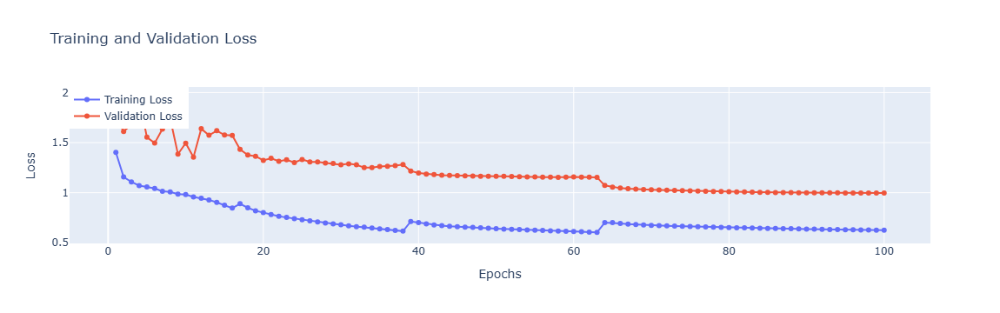

In [3]:
# Plot training and validation loss using Plotly
def plot_training_history(history):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=list(range(1, len(history.history['loss']) + 1)), y=history.history['loss'],
                        mode='lines+markers',
                        name='Training Loss'))
    fig.add_trace(go.Scatter(x=list(range(1, len(history.history['val_loss']) + 1)), y=history.history['val_loss'],
                        mode='lines+markers',
                        name='Validation Loss'))

    fig.update_layout(title='Training and Validation Loss',
                   xaxis_title='Epochs',
                   yaxis_title='Loss',
                   legend=dict(x=0, y=1))
    fig.show()

# Display the training history plot
plot_training_history(history)

In [4]:
# Save the enhanced model
model_save_path = 'REV_IN_hybrid_unet_rdn_model_with_attention_resnet50'
enhanced_model.save(model_save_path)
print(f"Model saved to {model_save_path} in TensorFlow SavedModel format.")

# Load the saved model with custom loss function
loaded_model = load_model(model_save_path, custom_objects={'combined_resnet_loss': combined_resnet_loss})
print("Model loaded successfully.")

INFO:tensorflow:Assets written to: REV_IN_hybrid_unet_rdn_model_with_attention_resnet50\assets


INFO:tensorflow:Assets written to: REV_IN_hybrid_unet_rdn_model_with_attention_resnet50\assets


Model saved to REV_IN_hybrid_unet_rdn_model_with_attention_resnet50 in TensorFlow SavedModel format.
Model loaded successfully.


Evaluating Model:   0%|                                                                        | 0/284 [00:00<?, ?it/s]

1/1 [==============================] - 1s 724ms/step


Evaluating Model:   0%|▏                                                               | 1/284 [00:02<09:35,  2.03s/it]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:   1%|▍                                                               | 2/284 [00:02<05:35,  1.19s/it]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:   1%|▋                                                               | 3/284 [00:03<04:21,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:   1%|▉                                                               | 4/284 [00:03<03:47,  1.23it/s]

1/1 [==============================] - 0s 41ms/step


Evaluating Model:   2%|█▏                                                              | 5/284 [00:04<03:24,  1.36it/s]

1/1 [==============================] - 0s 42ms/step


Evaluating Model:   2%|█▎                                                              | 6/284 [00:05<03:06,  1.49it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:   2%|█▌                                                              | 7/284 [00:05<03:02,  1.52it/s]

1/1 [==============================] - 0s 41ms/step


Evaluating Model:   3%|█▊                                                              | 8/284 [00:06<02:54,  1.58it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   3%|██                                                              | 9/284 [00:06<02:54,  1.57it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:   4%|██▏                                                            | 10/284 [00:07<02:49,  1.62it/s]

1/1 [==============================] - 0s 40ms/step


Evaluating Model:   4%|██▍                                                            | 11/284 [00:08<02:42,  1.68it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:   4%|██▋                                                            | 12/284 [00:08<02:40,  1.70it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:   5%|██▉                                                            | 13/284 [00:09<02:35,  1.74it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:   5%|███                                                            | 14/284 [00:09<02:41,  1.67it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:   5%|███▎                                                           | 15/284 [00:10<02:35,  1.73it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:   6%|███▌                                                           | 16/284 [00:10<02:35,  1.72it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:   6%|███▊                                                           | 17/284 [00:11<02:40,  1.67it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:   6%|███▉                                                           | 18/284 [00:12<02:34,  1.72it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:   7%|████▏                                                          | 19/284 [00:12<02:38,  1.67it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:   7%|████▍                                                          | 20/284 [00:13<02:34,  1.70it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   7%|████▋                                                          | 21/284 [00:13<02:36,  1.68it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   8%|████▉                                                          | 22/284 [00:14<02:36,  1.67it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:   8%|█████                                                          | 23/284 [00:15<02:31,  1.72it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:   8%|█████▎                                                         | 24/284 [00:15<02:32,  1.70it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:   9%|█████▌                                                         | 25/284 [00:16<02:30,  1.72it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:   9%|█████▊                                                         | 26/284 [00:16<02:37,  1.64it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  10%|█████▉                                                         | 27/284 [00:17<02:35,  1.65it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  10%|██████▏                                                        | 28/284 [00:18<02:29,  1.71it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  10%|██████▍                                                        | 29/284 [00:18<02:28,  1.72it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  11%|██████▋                                                        | 30/284 [00:19<02:25,  1.75it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  11%|██████▉                                                        | 31/284 [00:19<02:30,  1.68it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  11%|███████                                                        | 32/284 [00:20<02:28,  1.70it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  12%|███████▎                                                       | 33/284 [00:20<02:27,  1.71it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  12%|███████▌                                                       | 34/284 [00:21<02:28,  1.69it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  12%|███████▊                                                       | 35/284 [00:22<02:31,  1.64it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  13%|███████▉                                                       | 36/284 [00:22<02:28,  1.67it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  13%|████████▏                                                      | 37/284 [00:23<02:26,  1.69it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  13%|████████▍                                                      | 38/284 [00:23<02:23,  1.71it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  14%|████████▋                                                      | 39/284 [00:24<02:22,  1.72it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  14%|████████▊                                                      | 40/284 [00:25<02:21,  1.73it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  14%|█████████                                                      | 41/284 [00:25<02:23,  1.69it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  15%|█████████▎                                                     | 42/284 [00:26<02:18,  1.75it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  15%|█████████▌                                                     | 43/284 [00:26<02:19,  1.73it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  15%|█████████▊                                                     | 44/284 [00:27<02:16,  1.75it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  16%|█████████▉                                                     | 45/284 [00:27<02:14,  1.78it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  16%|██████████▏                                                    | 46/284 [00:28<02:15,  1.76it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  17%|██████████▍                                                    | 47/284 [00:29<02:13,  1.78it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  17%|██████████▋                                                    | 48/284 [00:29<02:16,  1.73it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  17%|██████████▊                                                    | 49/284 [00:30<02:12,  1.77it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  18%|███████████                                                    | 50/284 [00:30<02:16,  1.71it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  18%|███████████▎                                                   | 51/284 [00:31<02:14,  1.73it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  18%|███████████▌                                                   | 52/284 [00:32<02:19,  1.66it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  19%|███████████▊                                                   | 53/284 [00:32<02:20,  1.64it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  19%|███████████▉                                                   | 54/284 [00:33<02:22,  1.61it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  19%|████████████▏                                                  | 55/284 [00:33<02:19,  1.64it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  20%|████████████▍                                                  | 56/284 [00:34<02:21,  1.61it/s]

1/1 [==============================] - 0s 42ms/step


Evaluating Model:  20%|████████████▋                                                  | 57/284 [00:35<02:16,  1.67it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  20%|████████████▊                                                  | 58/284 [00:35<02:15,  1.67it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  21%|█████████████                                                  | 59/284 [00:36<02:12,  1.70it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  21%|█████████████▎                                                 | 60/284 [00:36<02:14,  1.67it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  21%|█████████████▌                                                 | 61/284 [00:37<02:11,  1.70it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  22%|█████████████▊                                                 | 62/284 [00:37<02:07,  1.74it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  22%|█████████████▉                                                 | 63/284 [00:38<02:08,  1.72it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  23%|██████████████▏                                                | 64/284 [00:39<02:04,  1.76it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  23%|██████████████▍                                                | 65/284 [00:39<02:07,  1.71it/s]

1/1 [==============================] - 0s 43ms/step


Evaluating Model:  23%|██████████████▋                                                | 66/284 [00:40<02:04,  1.75it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  24%|██████████████▊                                                | 67/284 [00:40<02:08,  1.69it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  24%|███████████████                                                | 68/284 [00:41<02:10,  1.66it/s]

1/1 [==============================] - 0s 43ms/step


Evaluating Model:  24%|███████████████▎                                               | 69/284 [00:42<02:06,  1.71it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  25%|███████████████▌                                               | 70/284 [00:42<02:09,  1.65it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  25%|███████████████▊                                               | 71/284 [00:43<02:06,  1.69it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  25%|███████████████▉                                               | 72/284 [00:43<02:09,  1.64it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  26%|████████████████▏                                              | 73/284 [00:44<02:06,  1.67it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  26%|████████████████▍                                              | 74/284 [00:45<02:02,  1.72it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  26%|████████████████▋                                              | 75/284 [00:45<02:03,  1.69it/s]

1/1 [==============================] - 0s 43ms/step


Evaluating Model:  27%|████████████████▊                                              | 76/284 [00:46<02:00,  1.73it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  27%|█████████████████                                              | 77/284 [00:46<02:03,  1.68it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  27%|█████████████████▎                                             | 78/284 [00:47<02:02,  1.69it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  28%|█████████████████▌                                             | 79/284 [00:47<01:58,  1.73it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  28%|█████████████████▋                                             | 80/284 [00:48<02:02,  1.67it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  29%|█████████████████▉                                             | 81/284 [00:49<02:00,  1.68it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  29%|██████████████████▏                                            | 82/284 [00:49<02:01,  1.66it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  29%|██████████████████▍                                            | 83/284 [00:50<01:58,  1.70it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  30%|██████████████████▋                                            | 84/284 [00:50<01:56,  1.71it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  30%|██████████████████▊                                            | 85/284 [00:51<01:55,  1.72it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  30%|███████████████████                                            | 86/284 [00:52<01:52,  1.76it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  31%|███████████████████▎                                           | 87/284 [00:52<01:55,  1.70it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  31%|███████████████████▌                                           | 88/284 [00:53<01:52,  1.74it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  31%|███████████████████▋                                           | 89/284 [00:53<01:52,  1.73it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  32%|███████████████████▉                                           | 90/284 [00:54<01:51,  1.74it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  32%|████████████████████▏                                          | 91/284 [00:55<01:53,  1.70it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  32%|████████████████████▍                                          | 92/284 [00:55<01:56,  1.65it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  33%|████████████████████▋                                          | 93/284 [00:56<01:51,  1.71it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  33%|████████████████████▊                                          | 94/284 [00:56<01:49,  1.74it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  33%|█████████████████████                                          | 95/284 [00:57<01:47,  1.76it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  34%|█████████████████████▎                                         | 96/284 [00:57<01:47,  1.76it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  34%|█████████████████████▌                                         | 97/284 [00:58<01:46,  1.76it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  35%|█████████████████████▋                                         | 98/284 [00:59<01:50,  1.69it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  35%|█████████████████████▉                                         | 99/284 [00:59<01:52,  1.64it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  35%|█████████████████████▊                                        | 100/284 [01:00<01:51,  1.65it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  36%|██████████████████████                                        | 101/284 [01:00<01:49,  1.68it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  36%|██████████████████████▎                                       | 102/284 [01:01<01:47,  1.70it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  36%|██████████████████████▍                                       | 103/284 [01:02<01:46,  1.71it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  37%|██████████████████████▋                                       | 104/284 [01:02<01:46,  1.69it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  37%|██████████████████████▉                                       | 105/284 [01:03<01:45,  1.70it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  37%|███████████████████████▏                                      | 106/284 [01:03<01:43,  1.72it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  38%|███████████████████████▎                                      | 107/284 [01:04<01:41,  1.75it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  38%|███████████████████████▌                                      | 108/284 [01:04<01:40,  1.76it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  38%|███████████████████████▊                                      | 109/284 [01:05<01:40,  1.75it/s]

1/1 [==============================] - 0s 40ms/step


Evaluating Model:  39%|████████████████████████                                      | 110/284 [01:06<01:37,  1.78it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  39%|████████████████████████▏                                     | 111/284 [01:06<01:39,  1.74it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  39%|████████████████████████▍                                     | 112/284 [01:07<01:37,  1.77it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  40%|████████████████████████▋                                     | 113/284 [01:07<01:38,  1.74it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  40%|████████████████████████▉                                     | 114/284 [01:08<01:36,  1.76it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  40%|█████████████████████████                                     | 115/284 [01:08<01:36,  1.74it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  41%|█████████████████████████▎                                    | 116/284 [01:09<01:37,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  41%|█████████████████████████▌                                    | 117/284 [01:10<01:37,  1.70it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  42%|█████████████████████████▊                                    | 118/284 [01:10<01:40,  1.65it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  42%|█████████████████████████▉                                    | 119/284 [01:11<01:41,  1.63it/s]

1/1 [==============================] - 0s 42ms/step


Evaluating Model:  42%|██████████████████████████▏                                   | 120/284 [01:11<01:37,  1.68it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  43%|██████████████████████████▍                                   | 121/284 [01:12<01:38,  1.66it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  43%|██████████████████████████▋                                   | 122/284 [01:13<01:34,  1.71it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  43%|██████████████████████████▊                                   | 123/284 [01:13<01:33,  1.72it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  44%|███████████████████████████                                   | 124/284 [01:14<01:45,  1.51it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  44%|███████████████████████████▎                                  | 125/284 [01:15<01:42,  1.55it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  44%|███████████████████████████▌                                  | 126/284 [01:15<01:39,  1.58it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  45%|███████████████████████████▋                                  | 127/284 [01:16<01:36,  1.63it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  45%|███████████████████████████▉                                  | 128/284 [01:16<01:32,  1.68it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  45%|████████████████████████████▏                                 | 129/284 [01:17<01:31,  1.70it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  46%|████████████████████████████▍                                 | 130/284 [01:18<01:28,  1.74it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  46%|████████████████████████████▌                                 | 131/284 [01:18<01:30,  1.70it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  46%|████████████████████████████▊                                 | 132/284 [01:19<01:27,  1.74it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  47%|█████████████████████████████                                 | 133/284 [01:19<01:30,  1.66it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  47%|█████████████████████████████▎                                | 134/284 [01:20<01:28,  1.69it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  48%|█████████████████████████████▍                                | 135/284 [01:20<01:27,  1.71it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  48%|█████████████████████████████▋                                | 136/284 [01:21<01:27,  1.69it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  48%|█████████████████████████████▉                                | 137/284 [01:22<01:25,  1.71it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  49%|██████████████████████████████▏                               | 138/284 [01:22<01:27,  1.67it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  49%|██████████████████████████████▎                               | 139/284 [01:23<01:24,  1.72it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  49%|██████████████████████████████▌                               | 140/284 [01:23<01:23,  1.72it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  50%|██████████████████████████████▊                               | 141/284 [01:24<01:23,  1.72it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  50%|███████████████████████████████                               | 142/284 [01:25<01:24,  1.67it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  50%|███████████████████████████████▏                              | 143/284 [01:25<01:25,  1.65it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  51%|███████████████████████████████▍                              | 144/284 [01:26<01:22,  1.70it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  51%|███████████████████████████████▋                              | 145/284 [01:26<01:19,  1.74it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  51%|███████████████████████████████▊                              | 146/284 [01:27<01:21,  1.70it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  52%|████████████████████████████████                              | 147/284 [01:27<01:18,  1.74it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  52%|████████████████████████████████▎                             | 148/284 [01:28<01:19,  1.71it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  52%|████████████████████████████████▌                             | 149/284 [01:29<01:17,  1.74it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  53%|████████████████████████████████▋                             | 150/284 [01:29<01:19,  1.68it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  53%|████████████████████████████████▉                             | 151/284 [01:30<01:19,  1.67it/s]

1/1 [==============================] - 0s 43ms/step


Evaluating Model:  54%|█████████████████████████████████▏                            | 152/284 [01:30<01:18,  1.68it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  54%|█████████████████████████████████▍                            | 153/284 [01:31<01:18,  1.66it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  54%|█████████████████████████████████▌                            | 154/284 [01:32<01:16,  1.71it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  55%|█████████████████████████████████▊                            | 155/284 [01:32<01:17,  1.67it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  55%|██████████████████████████████████                            | 156/284 [01:33<01:14,  1.72it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  55%|██████████████████████████████████▎                           | 157/284 [01:33<01:12,  1.74it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  56%|██████████████████████████████████▍                           | 158/284 [01:34<01:12,  1.74it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  56%|██████████████████████████████████▋                           | 159/284 [01:35<01:14,  1.69it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  56%|██████████████████████████████████▉                           | 160/284 [01:35<01:15,  1.64it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  57%|███████████████████████████████████▏                          | 161/284 [01:36<01:13,  1.68it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  57%|███████████████████████████████████▎                          | 162/284 [01:36<01:11,  1.70it/s]

1/1 [==============================] - 0s 43ms/step


Evaluating Model:  57%|███████████████████████████████████▌                          | 163/284 [01:37<01:09,  1.73it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  58%|███████████████████████████████████▊                          | 164/284 [01:37<01:08,  1.75it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  58%|████████████████████████████████████                          | 165/284 [01:38<01:10,  1.70it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  58%|████████████████████████████████████▏                         | 166/284 [01:39<01:07,  1.74it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  59%|████████████████████████████████████▍                         | 167/284 [01:39<01:07,  1.74it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  59%|████████████████████████████████████▋                         | 168/284 [01:40<01:05,  1.77it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  60%|████████████████████████████████████▉                         | 169/284 [01:40<01:07,  1.71it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  60%|█████████████████████████████████████                         | 170/284 [01:41<01:06,  1.71it/s]

1/1 [==============================] - 0s 42ms/step


Evaluating Model:  60%|█████████████████████████████████████▎                        | 171/284 [01:42<01:04,  1.74it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  61%|█████████████████████████████████████▌                        | 172/284 [01:42<01:05,  1.71it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  61%|█████████████████████████████████████▊                        | 173/284 [01:43<01:04,  1.73it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  61%|█████████████████████████████████████▉                        | 174/284 [01:43<01:05,  1.68it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  62%|██████████████████████████████████████▏                       | 175/284 [01:44<01:04,  1.70it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  62%|██████████████████████████████████████▍                       | 176/284 [01:44<01:02,  1.73it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  62%|██████████████████████████████████████▋                       | 177/284 [01:45<01:01,  1.74it/s]

1/1 [==============================] - 0s 41ms/step


Evaluating Model:  63%|██████████████████████████████████████▊                       | 178/284 [01:46<00:59,  1.77it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  63%|███████████████████████████████████████                       | 179/284 [01:46<00:59,  1.76it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  63%|███████████████████████████████████████▎                      | 180/284 [01:47<00:58,  1.78it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  64%|███████████████████████████████████████▌                      | 181/284 [01:47<00:59,  1.74it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  64%|███████████████████████████████████████▋                      | 182/284 [01:48<00:57,  1.76it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  64%|███████████████████████████████████████▉                      | 183/284 [01:48<00:58,  1.74it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  65%|████████████████████████████████████████▏                     | 184/284 [01:49<00:58,  1.71it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  65%|████████████████████████████████████████▍                     | 185/284 [01:50<00:56,  1.75it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  65%|████████████████████████████████████████▌                     | 186/284 [01:50<00:58,  1.68it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  66%|████████████████████████████████████████▊                     | 187/284 [01:51<00:56,  1.72it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  66%|█████████████████████████████████████████                     | 188/284 [01:51<00:55,  1.73it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  67%|█████████████████████████████████████████▎                    | 189/284 [01:52<00:54,  1.74it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  67%|█████████████████████████████████████████▍                    | 190/284 [01:53<00:55,  1.69it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  67%|█████████████████████████████████████████▋                    | 191/284 [01:53<00:56,  1.66it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  68%|█████████████████████████████████████████▉                    | 192/284 [01:54<00:53,  1.72it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  68%|██████████████████████████████████████████▏                   | 193/284 [01:54<00:52,  1.73it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  68%|██████████████████████████████████████████▎                   | 194/284 [01:55<00:50,  1.77it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  69%|██████████████████████████████████████████▌                   | 195/284 [01:55<00:50,  1.77it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  69%|██████████████████████████████████████████▊                   | 196/284 [01:56<00:49,  1.76it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  69%|███████████████████████████████████████████                   | 197/284 [01:57<00:49,  1.77it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  70%|███████████████████████████████████████████▏                  | 198/284 [01:57<00:50,  1.70it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  70%|███████████████████████████████████████████▍                  | 199/284 [01:58<00:49,  1.72it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  70%|███████████████████████████████████████████▋                  | 200/284 [01:58<00:49,  1.70it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  71%|███████████████████████████████████████████▉                  | 201/284 [01:59<00:48,  1.72it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  71%|████████████████████████████████████████████                  | 202/284 [02:00<00:48,  1.71it/s]

1/1 [==============================] - 0s 43ms/step


Evaluating Model:  71%|████████████████████████████████████████████▎                 | 203/284 [02:00<00:48,  1.68it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  72%|████████████████████████████████████████████▌                 | 204/284 [02:01<00:46,  1.73it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  72%|████████████████████████████████████████████▊                 | 205/284 [02:01<00:47,  1.67it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  73%|████████████████████████████████████████████▉                 | 206/284 [02:02<00:45,  1.72it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  73%|█████████████████████████████████████████████▏                | 207/284 [02:02<00:44,  1.74it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  73%|█████████████████████████████████████████████▍                | 208/284 [02:03<00:43,  1.73it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  74%|█████████████████████████████████████████████▋                | 209/284 [02:04<00:42,  1.75it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  74%|█████████████████████████████████████████████▊                | 210/284 [02:04<00:43,  1.69it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  74%|██████████████████████████████████████████████                | 211/284 [02:05<00:42,  1.71it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  75%|██████████████████████████████████████████████▎               | 212/284 [02:05<00:41,  1.72it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  75%|██████████████████████████████████████████████▌               | 213/284 [02:06<00:41,  1.71it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  75%|██████████████████████████████████████████████▋               | 214/284 [02:06<00:40,  1.74it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  76%|██████████████████████████████████████████████▉               | 215/284 [02:07<00:41,  1.68it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  76%|███████████████████████████████████████████████▏              | 216/284 [02:08<00:39,  1.73it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  76%|███████████████████████████████████████████████▎              | 217/284 [02:08<00:39,  1.68it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  77%|███████████████████████████████████████████████▌              | 218/284 [02:09<00:38,  1.72it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  77%|███████████████████████████████████████████████▊              | 219/284 [02:09<00:37,  1.73it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  77%|████████████████████████████████████████████████              | 220/284 [02:10<00:37,  1.73it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  78%|████████████████████████████████████████████████▏             | 221/284 [02:11<00:37,  1.70it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  78%|████████████████████████████████████████████████▍             | 222/284 [02:11<00:36,  1.70it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  79%|████████████████████████████████████████████████▋             | 223/284 [02:12<00:35,  1.74it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  79%|████████████████████████████████████████████████▉             | 224/284 [02:12<00:34,  1.76it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  79%|█████████████████████████████████████████████████             | 225/284 [02:13<00:33,  1.74it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  80%|█████████████████████████████████████████████████▎            | 226/284 [02:13<00:33,  1.74it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  80%|█████████████████████████████████████████████████▌            | 227/284 [02:14<00:33,  1.68it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  80%|█████████████████████████████████████████████████▊            | 228/284 [02:15<00:33,  1.68it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  81%|█████████████████████████████████████████████████▉            | 229/284 [02:15<00:33,  1.66it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  81%|██████████████████████████████████████████████████▏           | 230/284 [02:16<00:33,  1.63it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  81%|██████████████████████████████████████████████████▍           | 231/284 [02:17<00:31,  1.67it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  82%|██████████████████████████████████████████████████▋           | 232/284 [02:17<00:31,  1.65it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  82%|██████████████████████████████████████████████████▊           | 233/284 [02:18<00:29,  1.71it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  82%|███████████████████████████████████████████████████           | 234/284 [02:18<00:30,  1.66it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  83%|███████████████████████████████████████████████████▎          | 235/284 [02:19<00:28,  1.71it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  83%|███████████████████████████████████████████████████▌          | 236/284 [02:19<00:28,  1.68it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  83%|███████████████████████████████████████████████████▋          | 237/284 [02:20<00:28,  1.65it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  84%|███████████████████████████████████████████████████▉          | 238/284 [02:21<00:26,  1.71it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  84%|████████████████████████████████████████████████████▏         | 239/284 [02:21<00:27,  1.65it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  85%|████████████████████████████████████████████████████▍         | 240/284 [02:22<00:25,  1.71it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  85%|████████████████████████████████████████████████████▌         | 241/284 [02:22<00:24,  1.73it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  85%|████████████████████████████████████████████████████▊         | 242/284 [02:23<00:24,  1.72it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  86%|█████████████████████████████████████████████████████         | 243/284 [02:24<00:23,  1.76it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  86%|█████████████████████████████████████████████████████▎        | 244/284 [02:24<00:23,  1.68it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  86%|█████████████████████████████████████████████████████▍        | 245/284 [02:25<00:22,  1.71it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  87%|█████████████████████████████████████████████████████▋        | 246/284 [02:25<00:21,  1.73it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  87%|█████████████████████████████████████████████████████▉        | 247/284 [02:26<00:20,  1.77it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  87%|██████████████████████████████████████████████████████▏       | 248/284 [02:26<00:20,  1.73it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  88%|██████████████████████████████████████████████████████▎       | 249/284 [02:27<00:20,  1.73it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  88%|██████████████████████████████████████████████████████▌       | 250/284 [02:28<00:19,  1.76it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  88%|██████████████████████████████████████████████████████▊       | 251/284 [02:28<00:19,  1.69it/s]

1/1 [==============================] - 0s 43ms/step


Evaluating Model:  89%|███████████████████████████████████████████████████████       | 252/284 [02:29<00:18,  1.74it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  89%|███████████████████████████████████████████████████████▏      | 253/284 [02:29<00:18,  1.70it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  89%|███████████████████████████████████████████████████████▍      | 254/284 [02:30<00:17,  1.70it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  90%|███████████████████████████████████████████████████████▋      | 255/284 [02:31<00:16,  1.74it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  90%|███████████████████████████████████████████████████████▉      | 256/284 [02:31<00:16,  1.70it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  90%|████████████████████████████████████████████████████████      | 257/284 [02:32<00:15,  1.74it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  91%|████████████████████████████████████████████████████████▎     | 258/284 [02:32<00:15,  1.68it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  91%|████████████████████████████████████████████████████████▌     | 259/284 [02:33<00:14,  1.72it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  92%|████████████████████████████████████████████████████████▊     | 260/284 [02:33<00:13,  1.74it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  92%|████████████████████████████████████████████████████████▉     | 261/284 [02:34<00:13,  1.73it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  92%|█████████████████████████████████████████████████████████▏    | 262/284 [02:35<00:12,  1.74it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  93%|█████████████████████████████████████████████████████████▍    | 263/284 [02:35<00:12,  1.68it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  93%|█████████████████████████████████████████████████████████▋    | 264/284 [02:36<00:11,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  93%|█████████████████████████████████████████████████████████▊    | 265/284 [02:36<00:11,  1.70it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  94%|██████████████████████████████████████████████████████████    | 266/284 [02:37<00:10,  1.72it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  94%|██████████████████████████████████████████████████████████▎   | 267/284 [02:38<00:10,  1.69it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  94%|██████████████████████████████████████████████████████████▌   | 268/284 [02:38<00:09,  1.68it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  95%|██████████████████████████████████████████████████████████▋   | 269/284 [02:39<00:08,  1.74it/s]

1/1 [==============================] - 0s 41ms/step


Evaluating Model:  95%|██████████████████████████████████████████████████████████▉   | 270/284 [02:39<00:08,  1.71it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  95%|███████████████████████████████████████████████████████████▏  | 271/284 [02:40<00:07,  1.74it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  96%|███████████████████████████████████████████████████████████▍  | 272/284 [02:40<00:06,  1.76it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  96%|███████████████████████████████████████████████████████████▌  | 273/284 [02:41<00:06,  1.72it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  96%|███████████████████████████████████████████████████████████▊  | 274/284 [02:42<00:05,  1.76it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  97%|████████████████████████████████████████████████████████████  | 275/284 [02:42<00:05,  1.71it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  97%|████████████████████████████████████████████████████████████▎ | 276/284 [02:43<00:04,  1.75it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  98%|████████████████████████████████████████████████████████████▍ | 277/284 [02:43<00:04,  1.71it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  98%|████████████████████████████████████████████████████████████▋ | 278/284 [02:44<00:03,  1.77it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  98%|████████████████████████████████████████████████████████████▉ | 279/284 [02:44<00:02,  1.78it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  99%|█████████████████████████████████████████████████████████████▏| 280/284 [02:45<00:02,  1.80it/s]

1/1 [==============================] - 0s 42ms/step


Evaluating Model:  99%|█████████████████████████████████████████████████████████████▎| 281/284 [02:46<00:01,  1.77it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  99%|█████████████████████████████████████████████████████████████▌| 282/284 [02:46<00:01,  1.75it/s]

1/1 [==============================] - 0s 43ms/step


Evaluating Model: 100%|█████████████████████████████████████████████████████████████▊| 283/284 [02:47<00:00,  1.80it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model: 100%|██████████████████████████████████████████████████████████████| 284/284 [02:47<00:00,  1.69it/s]


PSNR: 20.4355, SSIM: 0.8570, MSE: 0.011103, CIEDE2000: 8.6863
1/1 [==============================] - 0s 50ms/step


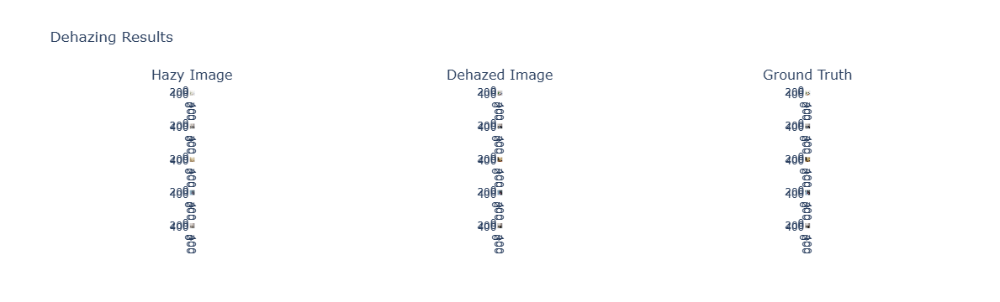

In [5]:
import plotly.express as px
import plotly.subplots as sp

# Function to plot randomly selected dehazed images using Plotly
def plot_random_dehazed_images(model, hazy_img_paths, gt_img_paths=None, num_images=5, target_size=(512, 512)):
    """Plot randomly selected dehazed images alongside their hazy versions and ground truths."""
    selected_indices = random.sample(range(len(hazy_img_paths)), num_images)
    fig = sp.make_subplots(rows=num_images, cols=3, subplot_titles=["Hazy Image", "Dehazed Image", "Ground Truth"])
    
    for i, idx in enumerate(selected_indices):
        # Load and preprocess the hazy image
        hazy_img = Image.open(hazy_img_paths[idx])
        hazy_img = hazy_img.resize(target_size)
        hazy_img = np.array(hazy_img) / 255.0
        hazy_input = np.expand_dims(hazy_img, axis=0)
        
        # Predict the dehazed image
        dehazed_img = model.predict(hazy_input)[0]
        
        # Post-process dehazed output to visualize correctly
        dehazed_img = np.clip(dehazed_img, 0, 1)
        
        # Load the ground truth image if available
        gt_img = None
        if gt_img_paths is not None and len(gt_img_paths) > 0:
            gt_img = Image.open(gt_img_paths[idx])
            gt_img = gt_img.resize(target_size)
            gt_img = np.array(gt_img) / 255.0
        
        # Add images to subplots
        fig.add_trace(px.imshow(hazy_img).data[0], row=i+1, col=1)
        fig.add_trace(px.imshow(dehazed_img).data[0], row=i+1, col=2)
        if gt_img is not None:
            fig.add_trace(px.imshow(gt_img).data[0], row=i+1, col=3)

    fig.update_layout(height=600 * num_images, title_text="Dehazing Results")
    fig.show()

# Evaluate CIEDE2000 Color Difference
def calculate_ciede2000(image1, image2):
    """Calculate the CIEDE2000 color difference between two images."""
    lab1 = color.rgb2lab(image1)
    lab2 = color.rgb2lab(image2)
    ciede2000 = color.deltaE_ciede2000(lab1, lab2)
    return np.mean(ciede2000)

# Evaluate the model
def evaluate_model(model, dataset, win_size=5):
    psnr_values = []
    ssim_values = []
    mse_values = []
    ciede2000_values = []
    
    for X_batch, y_batch in tqdm(dataset, desc="Evaluating Model"):
        y_pred = model.predict(X_batch)
        for true, pred in zip(y_batch, y_pred):
            if isinstance(true, tf.Tensor):
                true = true.numpy()
            if isinstance(pred, tf.Tensor):
                pred = pred.numpy()
            
            true = true.astype(np.float32)
            pred = pred.astype(np.float32)
            
            psnr = tf.image.psnr(true, pred, max_val=1.0).numpy()
            psnr_values.append(psnr)
            
            ssim_index = ssim(true, pred, channel_axis=-1, data_range=1.0, win_size=win_size)
            ssim_values.append(ssim_index)
            
            mse = np.mean((true - pred) ** 2)
            mse_values.append(mse)
            
            ciede2000 = calculate_ciede2000(true, pred)
            ciede2000_values.append(ciede2000)
    
    return (
        np.mean(psnr_values), 
        np.mean(ssim_values), 
        np.mean(mse_values), 
        np.mean(ciede2000_values)
    )

# Evaluate model
psnr, ssim_index, mse, ciede2000 = evaluate_model(loaded_model, test_dataset, win_size=5)
print(f"PSNR: {psnr:.4f}, SSIM: {ssim_index:.4f}, MSE: {mse:.6f}, CIEDE2000: {ciede2000:.4f}")

# Plot the randomly selected dehazed images
plot_random_dehazed_images(loaded_model, test_hazy_paths, test_gt_paths, num_images=5)